## Import libraries

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import hypertools as hyp
import numpy as np
from scipy.spatial.distance import cdist
from scipy.signal import resample
from scipy import ndimage
from scipy.stats import zscore
from skimage.transform import resize
from fastdtw import fastdtw
from scipy.spatial.distance import correlation
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer
import wordcloud
from PIL import Image
import pickle

sns.set_context('poster')
%matplotlib inline
plt.rc('figure', figsize=(12, 8))

## Load data

In [2]:
movie_text = pd.read_excel('../data/Sherlock_Segments_1000_NN_2017.xlsx', )
movie_text['Scene Segments'].fillna(method='ffill', inplace=True)

## Create overlapping movie segments

In [3]:
# create a list of text samples from the scene descriptions / details to train the topic model
movie = movie_text.loc[:,'Scene Details - A Level ':'Words on Screen '].apply(lambda x: ', '.join(x.fillna('')), axis=1).values.tolist()

# create a list of overlapping text samples
movie50 = []
wsize=50
for idx, sentence in enumerate(movie):
    movie50.append(','.join(movie[idx:idx+wsize]))

## Fit models

In [6]:
# initialize models
cv = CountVectorizer(stop_words='english')
tm = LatentDirichletAllocation(n_components=100, learning_method='batch', random_state=0)

cv.fit(movie50)
cv_movie = cv.transform(movie50)

tm.fit(cv_movie)
movie_model = tm.transform(cv_movie)

## Save models

In [8]:
with open('../data/topic_model', 'wb') as f:
    pickle.dump(tm, f)
    
with open('../data/count_vectorizer_model', 'wb') as f:
    pickle.dump(cv, f)

## Compute segment times

In [5]:
video_event_times = np.load('../data/video_event_times.npy')
hinges = np.array([0, 2, 4, 8, 10, 13, 17, 19, 21, 23, 27, 31, 33])
hinge_times = [(video_event_times[hinges[i]][0], video_event_times[hinges[i+1]][0]) for i in range(len(hinges)-1)]

## Print top n words from top n topics

In [6]:
seg_topic_inds = np.load('../data/seg_topic_inds.npy')

ntopics = 5
nwords = 10
segwords = []
segweights = []
fnames = np.array(cv.get_feature_names())
for i, (seg, time) in enumerate(zip(seg_topic_inds, hinge_times)):
    print('Segment %d, %d to %d TRs: topic %d words for top %d topics' % (i+1, time[0], time[1], nwords, ntopics) )
    print('--')
    s=[]
    w=[]
    for ind in seg[:ntopics]:
        print(fnames[np.argsort(tm.components_[ind, :])[::-1][:nwords]])
        s.extend(fnames[np.argsort(tm.components_[ind, :])[::-1][:nwords]])
        w.extend(np.sort(tm.components_[ind, :])[::-1][:nwords])
    segwords.append(s)
    segweights.append(w)
    print('-----')

Segment 1, 0 to 93 TRs: topic 10 words for top 5 topics
--
['john' 'indoor' 'room' 'medium' 'psychotherapist' 'yes' 'soldiers'
 'close' 'london' 'outdoor']
['john' 'jeffrey' 'sir' 'indoor' 'yes' 'medium' 'psychotherapist' 'helen'
 'office' 'london']
['jimmy' 'yes' 'gary' 'sir' 'jeffrey' 'medium' 'indoor' 'outdoor'
 'psychotherapist' 'rain']
['sherlock' 'john' 'donovan' 'medium' 'lauriston' 'gardens' 'anderson'
 'street' 'outdoor' 'lestrade']
['yes' 'jeffrey' 'sir' 'jimmy' 'aide' 'indoor' 'medium' 'woman' 'helen'
 'man']
-----
Segment 2, 93 to 210 TRs: topic 10 words for top 5 topics
--
['jimmy' 'yes' 'indoor' 'donovan' 'medium' 'aide' 'gary' 'lestrade'
 'press' 'conference']
['lestrade' 'donovan' 'indoor' 'room' 'medium' 'aide' 'press' 'conference'
 'police' 'reporter']
['yes' 'jeffrey' 'sir' 'jimmy' 'aide' 'indoor' 'medium' 'woman' 'helen'
 'man']
['jimmy' 'yes' 'gary' 'sir' 'jeffrey' 'medium' 'indoor' 'outdoor'
 'psychotherapist' 'rain']
['lestrade' 'donovan' 'room' 'indoor' 'press' 

## Get top n words from top m topics for hinge events

In [7]:
hinge_topic_inds = np.load('../data/hinge_topic_inds.npy')

ntopics = 5
nwords = 20
fnames = np.array(cv.get_feature_names())
hingewords = []
for i, (h, inds) in enumerate(zip(hinges, hinge_topic_inds)):
    print('Hinge %d, %d to %d TRs: topic %d words for top %d topics' % (i+1, video_event_times[h][0], video_event_times[h][1], nwords, ntopics) )
    print('--')
    s=[]
    for ind in inds[:ntopics]:
        s.extend(fnames[np.argsort(tm.components_[ind, :])[::-1][:nwords]])
        print(fnames[np.argsort(tm.components_[ind, :])[::-1][:nwords]])
    hingewords.append(s)
    print('-----')

Hinge 1, 0 to 34 TRs: topic 20 words for top 5 topics
--
['john' 'indoor' 'room' 'medium' 'psychotherapist' 'yes' 'soldiers'
 'close' 'london' 'outdoor' 'unknown' 'view' 'soldier' 'office' 'desk'
 'afghanistan' 'screen' 'bed' 'blog' 'woman']
['sherlock' 'john' 'donovan' 'medium' 'lauriston' 'gardens' 'anderson'
 'street' 'outdoor' 'lestrade' 'says' 'singers' 'shoulder' 'cartoon'
 'background' 'tracking' 'yes' 'indoor' 'asks' 'world']
['john' 'jeffrey' 'sir' 'indoor' 'yes' 'medium' 'psychotherapist' 'helen'
 'office' 'london' 'room' 'building' 'close' 'patterson' 'unknown'
 'margaret' 'outdoor' 'says' 'station' 'railway']
['zooms' 'game' 'friend' 'friends' 'frightening' 'frontal' 'frontof'
 'frowns' 'frozen' 'frustrated' 'fun' 'funny' 'furiously' 'furnished'
 'furniture' 'gadget' 'garbage' 'happily' 'gardens' 'gary']
['lestrade' 'donovan' 'indoor' 'room' 'medium' 'aide' 'press' 'conference'
 'police' 'reporter' 'yes' 'woman' 'man' 'reporters' 'beth' 'looks'
 'davenport' 'jimmy' 'close' 

In [8]:
embeddings = np.load('../data/embeddings.npy')
video_embedding = embeddings[1].copy()

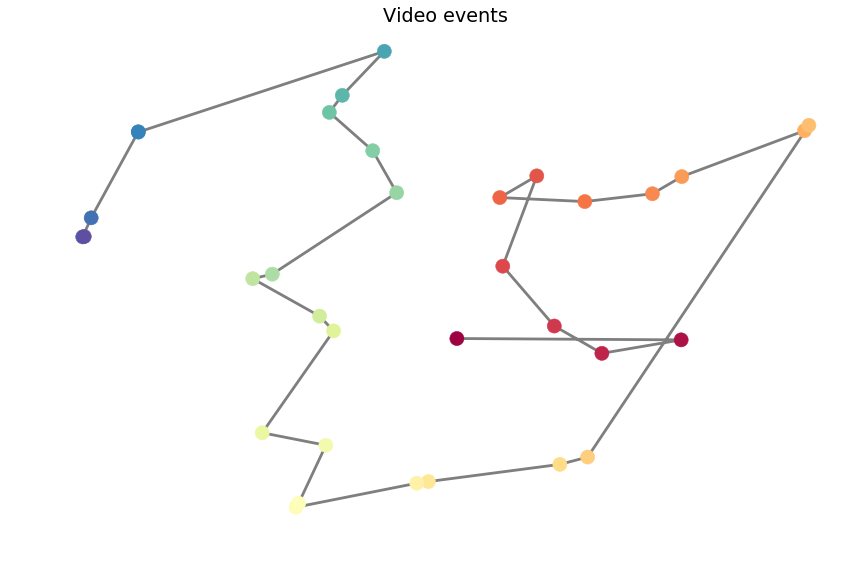

In [9]:
cmap = plt.cm.Spectral
plt.scatter(video_embedding[:, 0], video_embedding[:, 1], c=range(34), cmap=cmap, s=200, zorder=2)
plt.plot(video_embedding[:, 0], video_embedding[:, 1], zorder=1, c='k', alpha=.5)
plt.axis('off')
plt.title('Video events')
plt.tight_layout()
# plt.savefig('../figures/avg_traj_with_transitions.pdf')
plt.show()

In [192]:
recall_text = np.load('../data/recall_text.npy')
recall_event_times = np.load('../data/recall_event_times.npy')
matches = np.load('../data/labels.npy')

In [212]:
from wordcloud import (WordCloud, get_single_color_func)
from sklearn.feature_extraction.text import CountVectorizer
import random
text = []

def text2dict(text):
    cv = CountVectorizer(stop_words='english')
    cv_text = cv.fit_transform([text])
    return {k:v for k,v in zip(cv.get_feature_names(), cv_text.toarray().ravel())}

def color_func(word, font_size, position, orientation, random_state=None,
                    **kwargs):
    if word in intersection:
        return "hsl(0, 0%%, %d%%)" % 1
    else:
        return "hsl(0, 0%%, %d%%)" % 0

def plot_wordle(textdict, maskpath=None):
    circle = np.array(Image.open(maskpath))
    wc = WordCloud(collocations=False, background_color="white", mask=circle, width=2000, height=1000, colormap=plt.cm.Reds)
    wc.generate_from_frequencies(textdict)
    plt.imshow(wc.recolor(color_func=grouped_color_func, random_state=3),
           interpolation="bilinear")
    plt.axis("off")

class SimpleGroupedColorFunc(object):
    """Create a color function object which assigns EXACT colors
       to certain words based on the color to words mapping
       Parameters
       ----------
       color_to_words : dict(str -> list(str))
         A dictionary that maps a color to the list of words.
       default_color : str
         Color that will be assigned to a word that's not a member
         of any value from color_to_words.
    """

    def __init__(self, color_to_words, default_color):
        self.word_to_color = {word: color
                              for (color, words) in color_to_words.items()
                              for word in words}

        self.default_color = default_color

    def __call__(self, word, **kwargs):
        return self.word_to_color.get(word, self.default_color)
    
vi = 0
video_event_text = ['' for i in range(34)]
for i, row in movie_text.iterrows():
    if row['Start Time (TRs, 1.5s)']<video_event_times[vi][1] or i>=999:
        video_event_text[vi]+=movie[i]
    else:
        vi+=1
        video_event_text[vi]+=movie[i]

tmp = ['' for _ in range(34)]
for subj_texts, subj_times, subj_closest in zip(recall_text, recall_event_times, matches):
    for p_times, p_closest in zip(subj_times, subj_closest):
        tmp[p_closest]+=', '.join(subj_texts[p_times[0]:p_times[1]+1])

0
----------


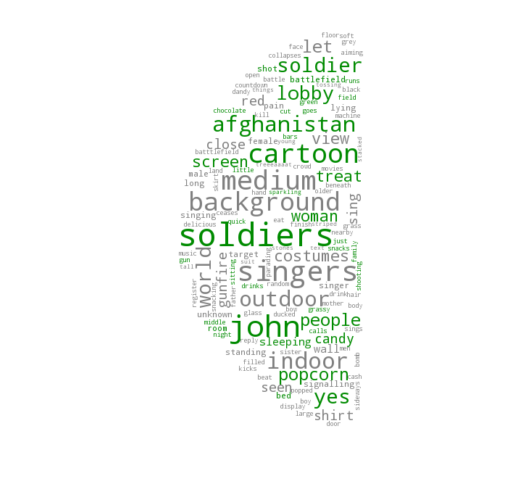

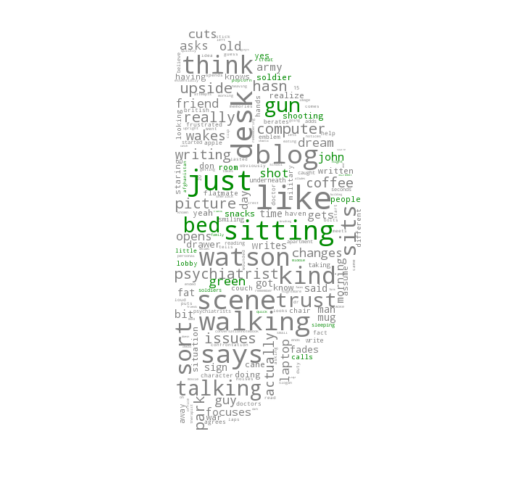

2
----------


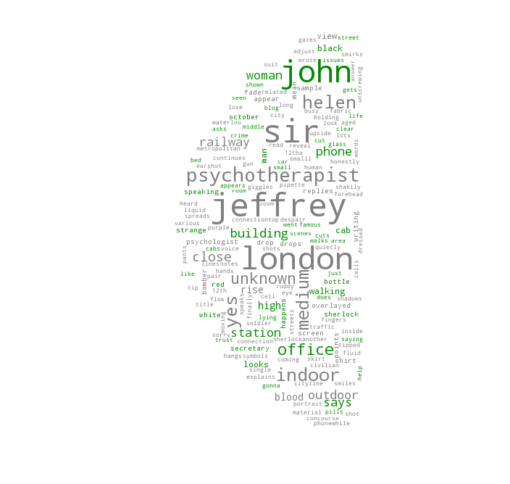

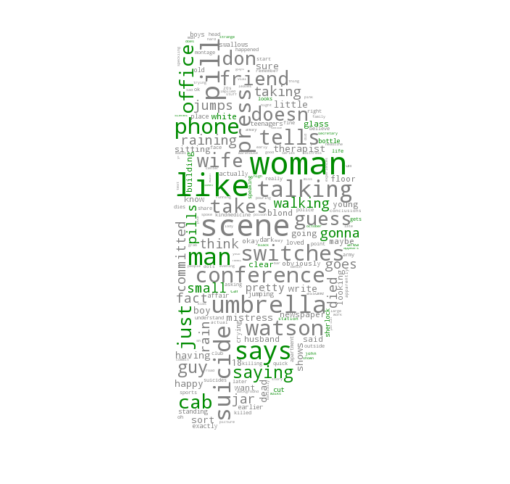

4
----------


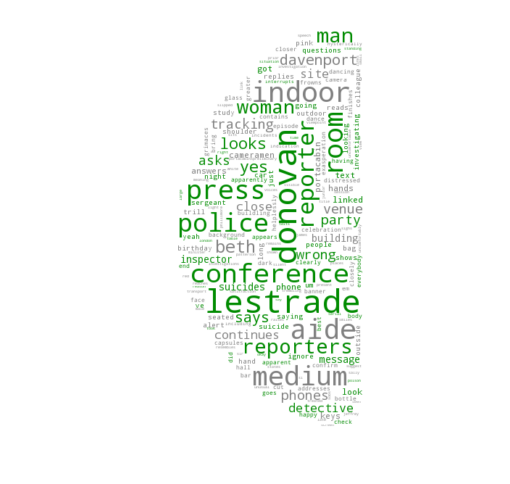

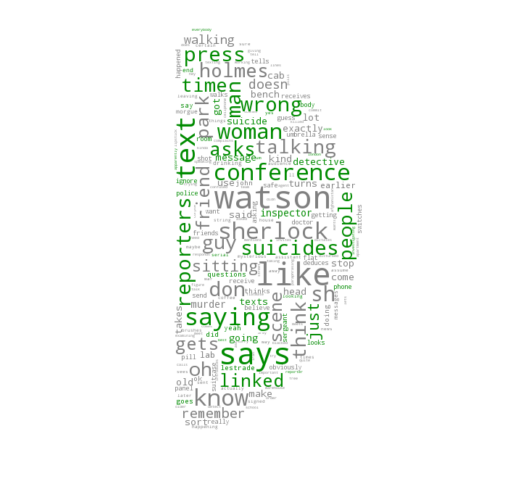

8
----------


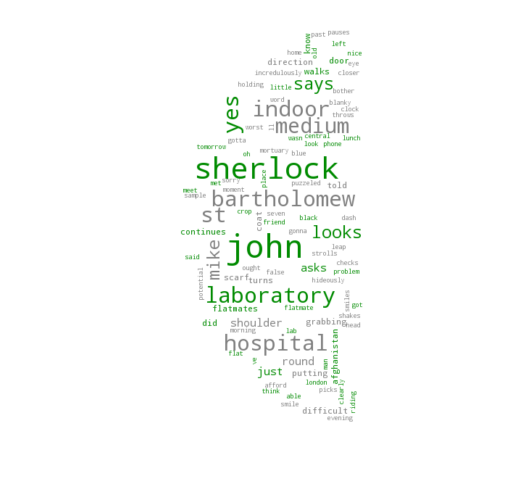

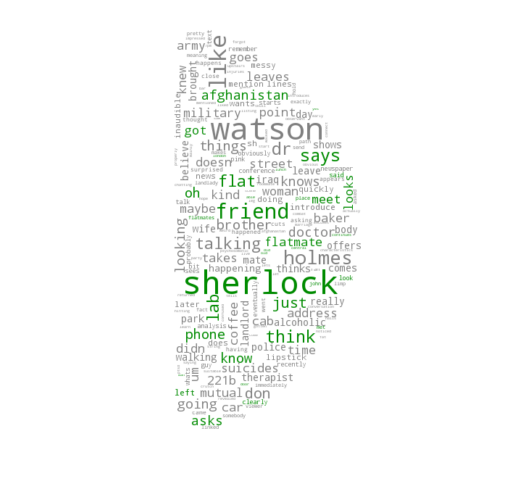

10
----------


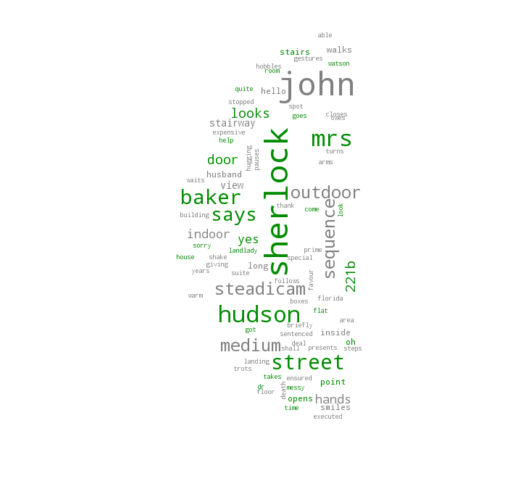

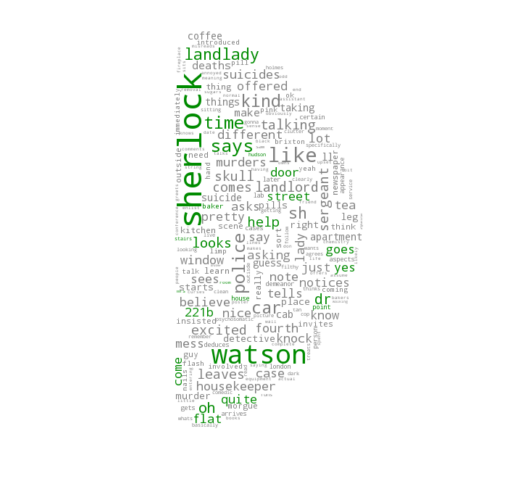

13
----------


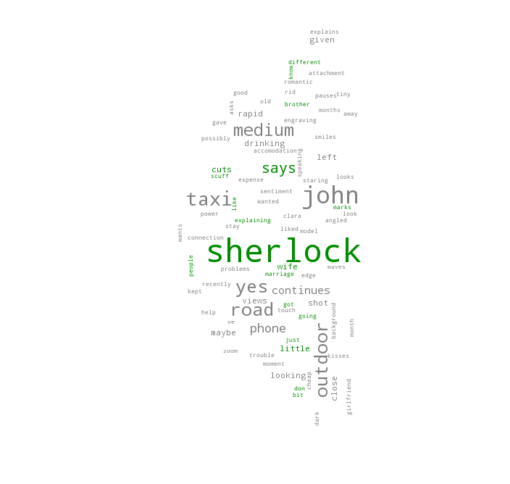

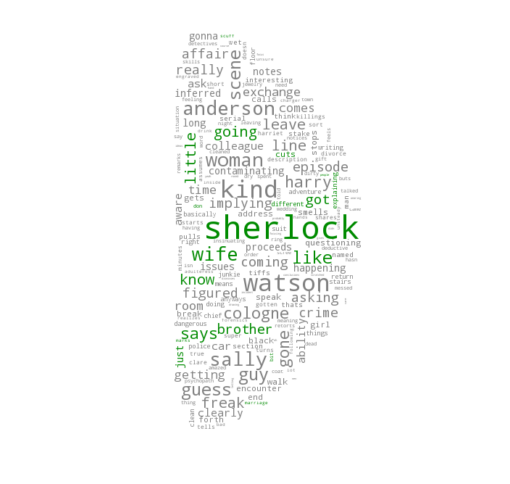

16
----------


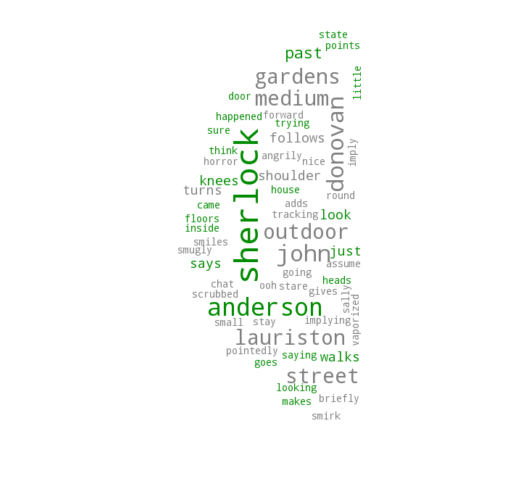

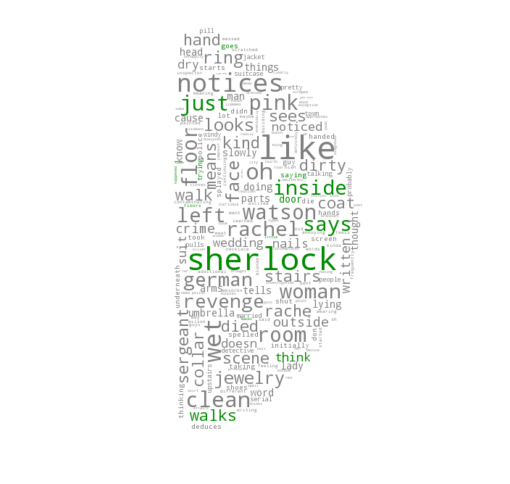

19
----------


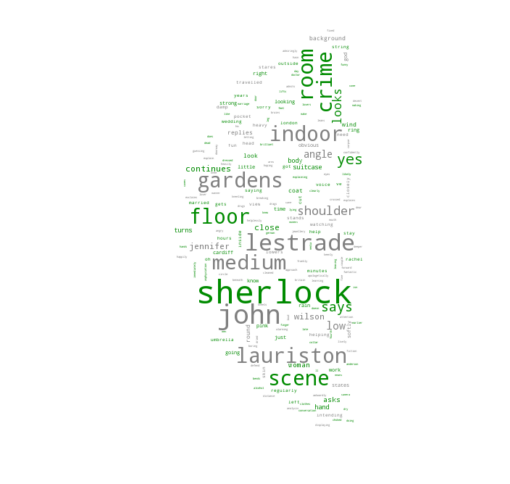

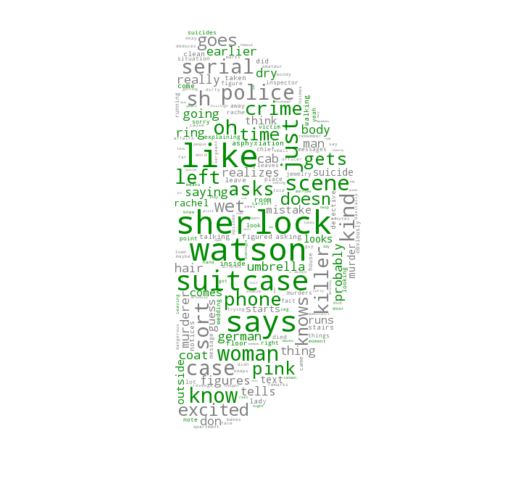

21
----------


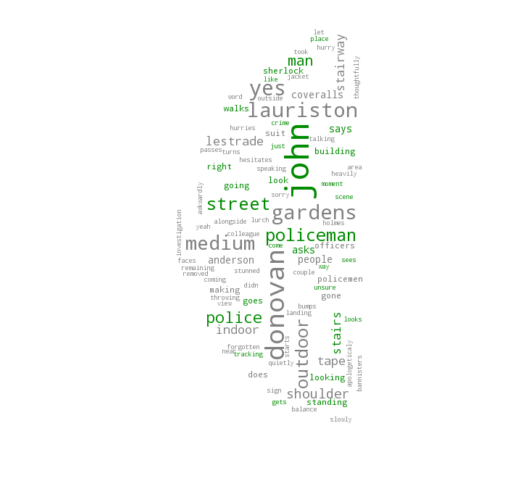

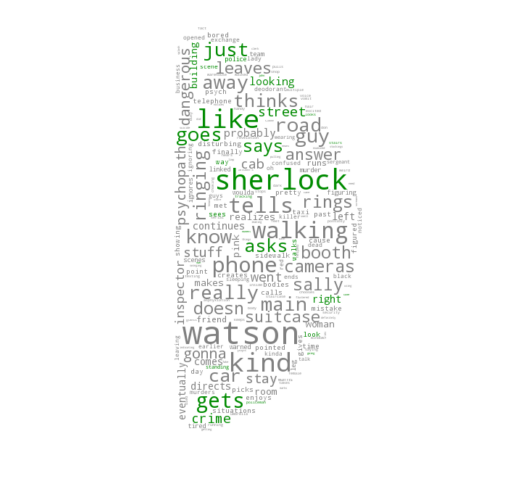

23
----------


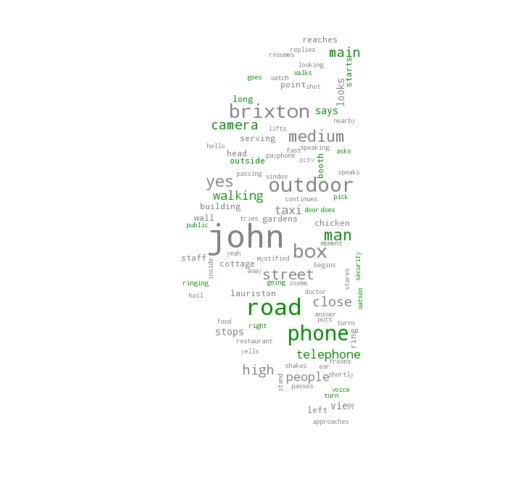

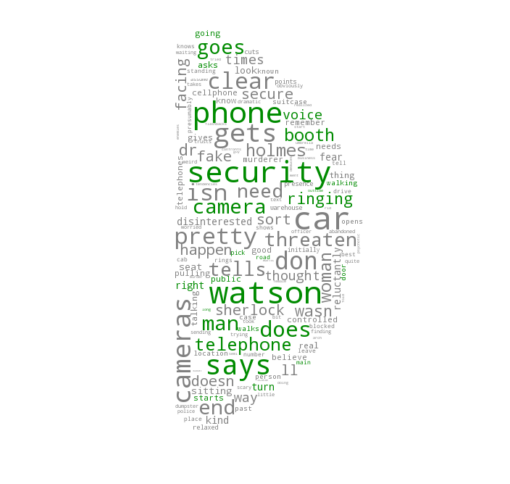

27
----------


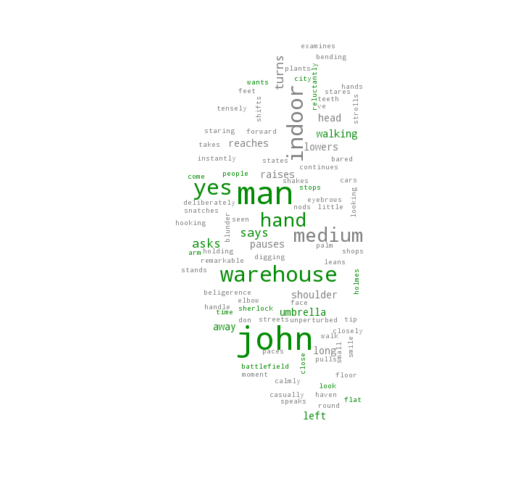

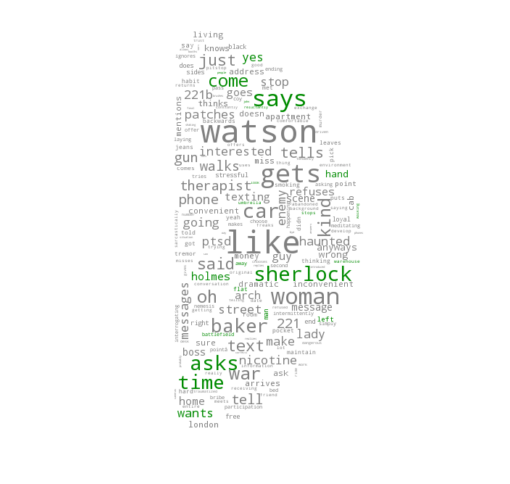

31
----------


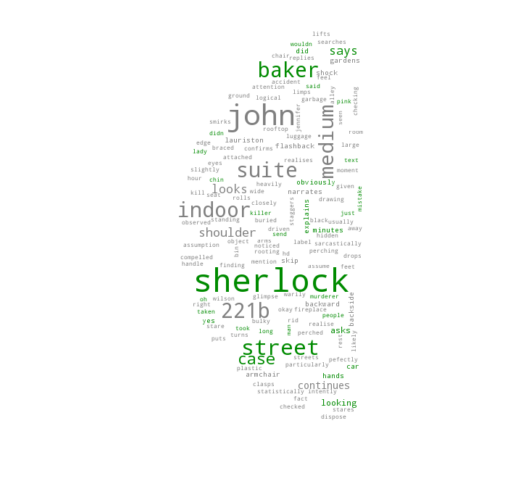

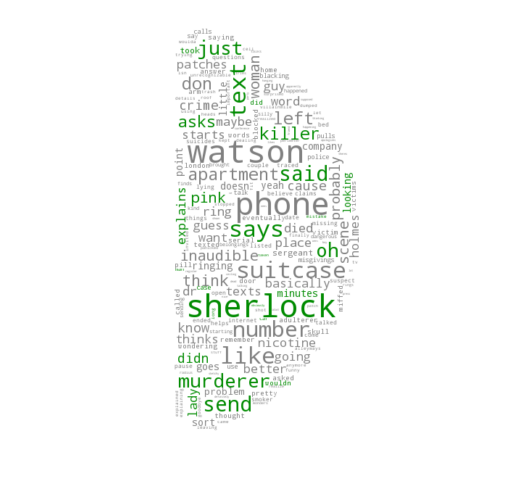

33
----------


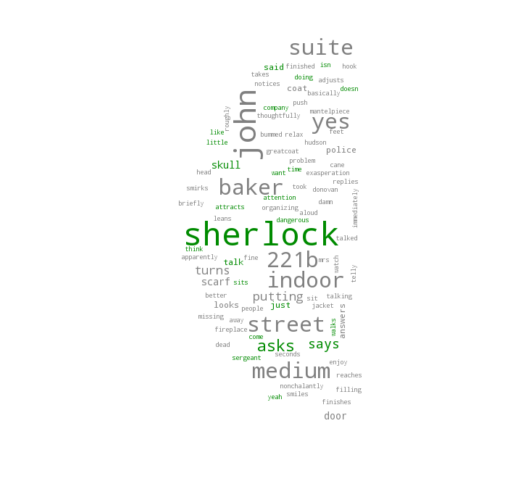

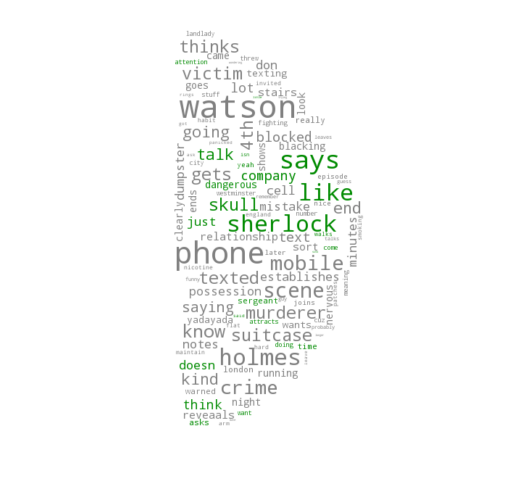

In [200]:
default_color = 'grey'
for seg in [0, 2, 4, 8, 10, 13, 16, 19, 21, 23, 27, 31, 33]:
    
    print(seg)
    print('----------')
    textdict_video = text2dict(video_event_text[seg])
#     textdict_video = {k:v for k,v in textdict_video.items() if v>1}
    textdict_recall = text2dict(tmp[seg])
#     textdict_recall = {k:v for k,v in textdict_recall.items() if v>1}
    
    color_to_words = {'#008b00': list(set(textdict_video).intersection(set(textdict_recall)))}
    grouped_color_func = SimpleGroupedColorFunc(color_to_words, default_color)

    plot_wordle(textdict_video, maskpath="../data/half-moon-left.jpg")
    plt.show()
    plot_wordle(textdict_recall, maskpath="../data/half-moon.jpg")
    plt.show()

0
----------


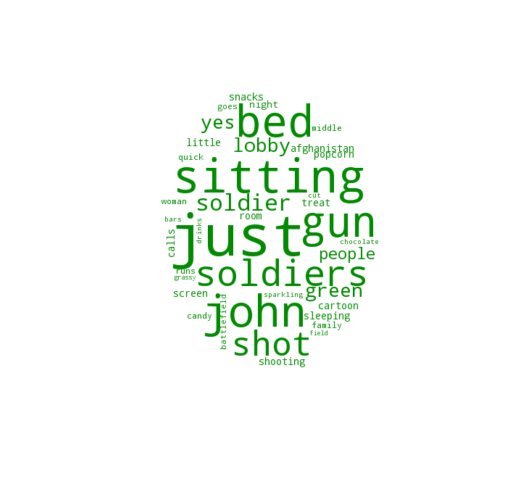

2
----------


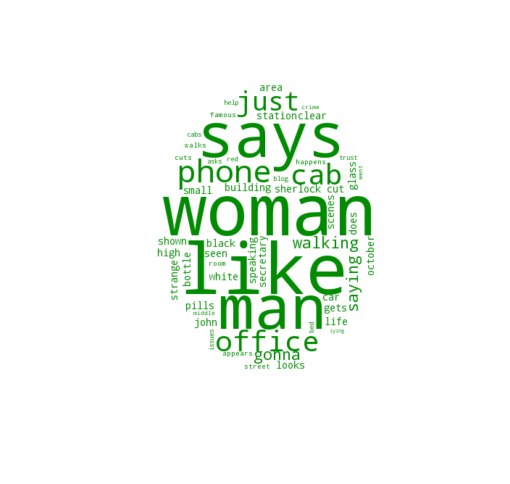

4
----------


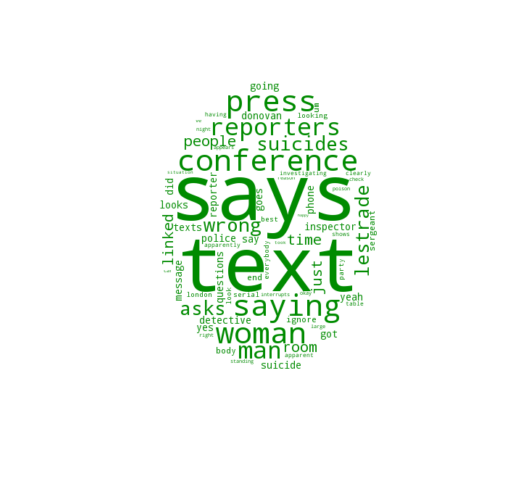

8
----------


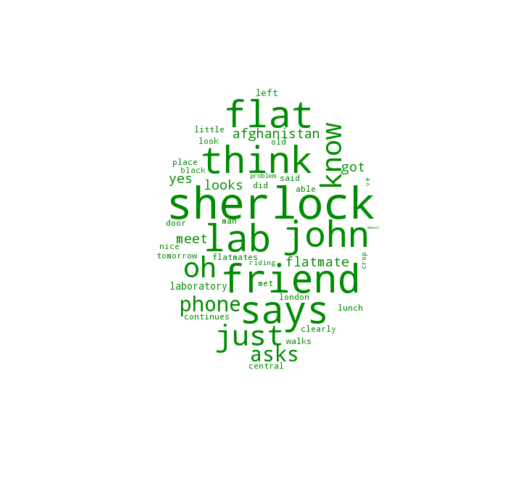

10
----------


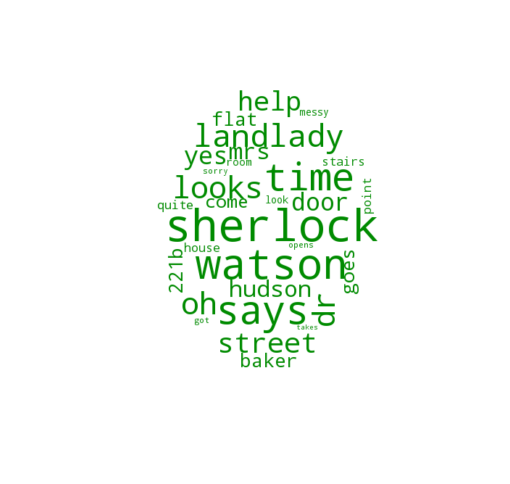

13
----------


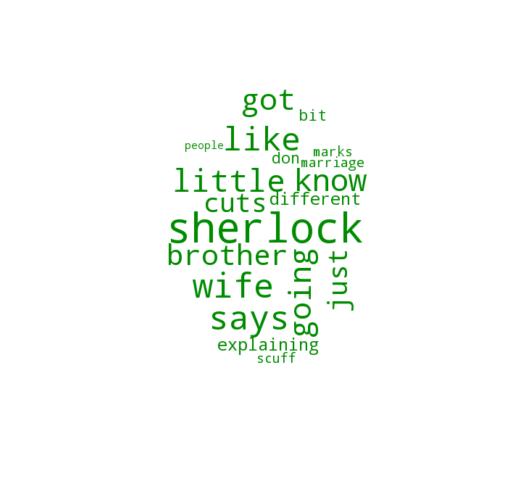

16
----------


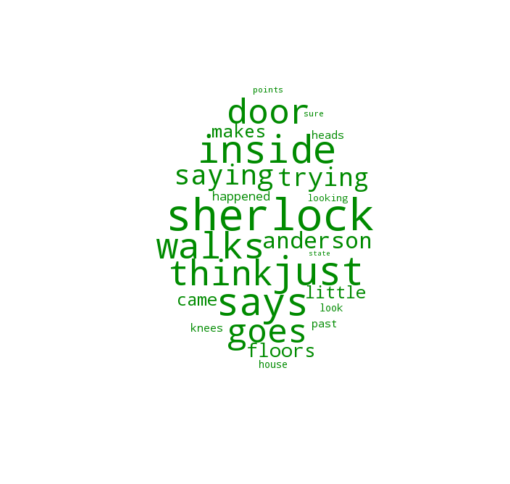

19
----------


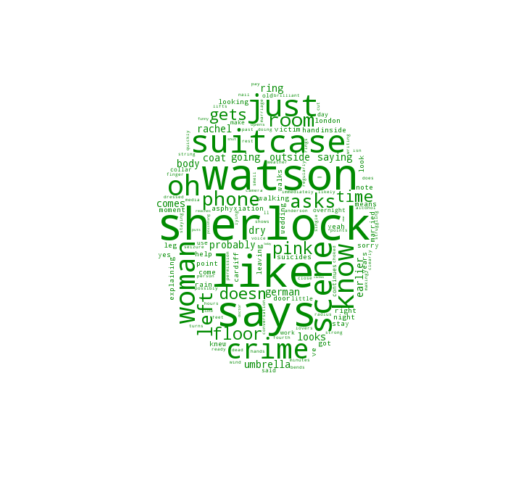

21
----------


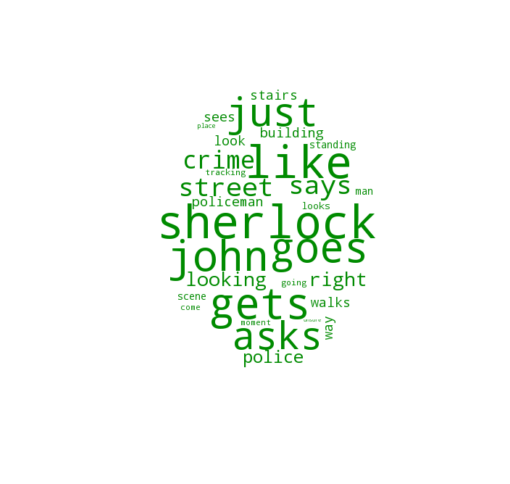

23
----------


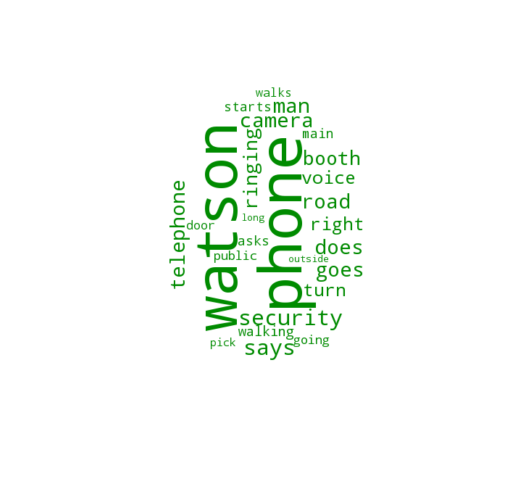

27
----------


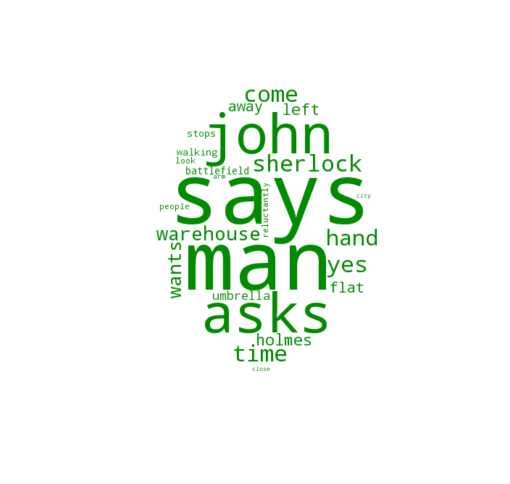

31
----------


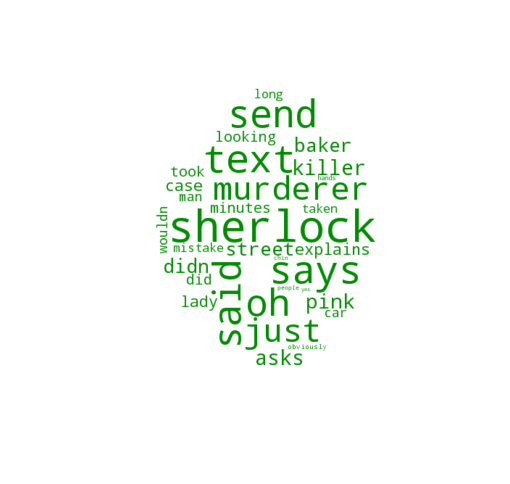

33
----------


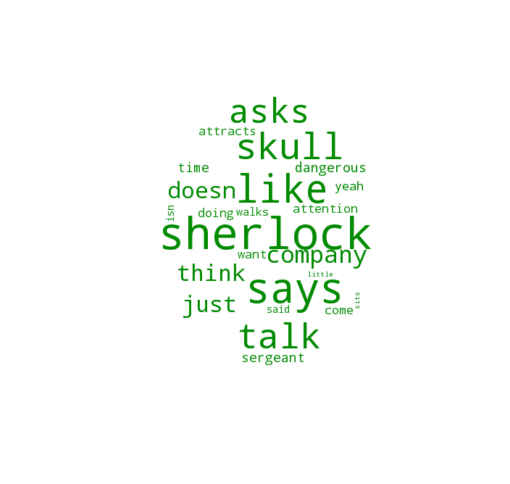

In [219]:
default_color = 'grey'
for seg in [0, 2, 4, 8, 10, 13, 16, 19, 21, 23, 27, 31, 33]:
    
    print(seg)
    print('----------')
    v = text2dict(video_event_text[seg])
#     textdict_video = {k:v for k,v in textdict_video.items() if v>1}
    r = text2dict(tmp[seg])
#     textdict_recall = {k:v for k,v in textdict_recall.items() if v>1}
    intersect = {w:np.log(v[w]+r[w]) for w in list(set(v).intersection(set(r)))}
    color_to_words = {'#008b00': intersect.keys()}
    grouped_color_func = SimpleGroupedColorFunc(color_to_words, default_color)

    plot_wordle(intersect, maskpath="../data/oval.jpg")
    plt.show()

In [221]:
video_events = np.load('../data/video_events.npy')
avg_recall_events = np.load('../data/avg_recall_events.npy')

0
----------


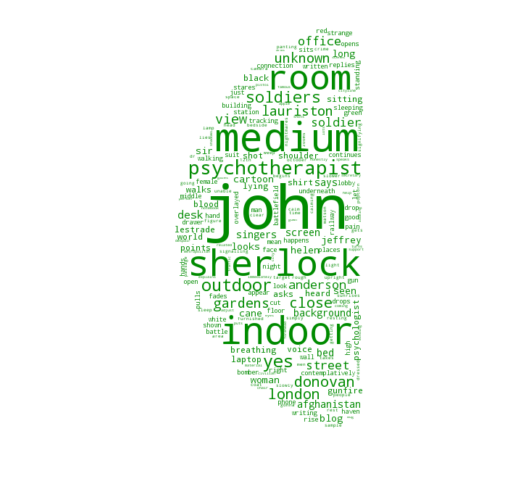

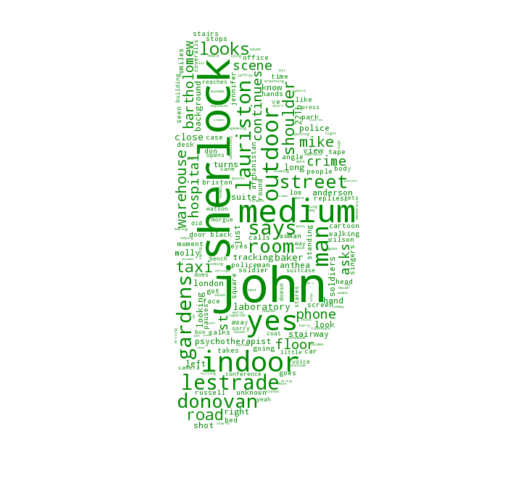

2
----------


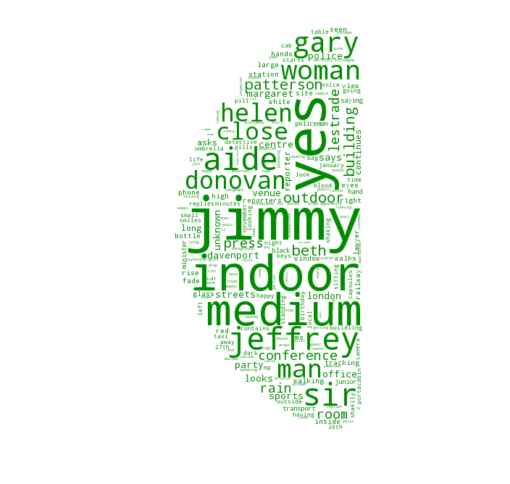

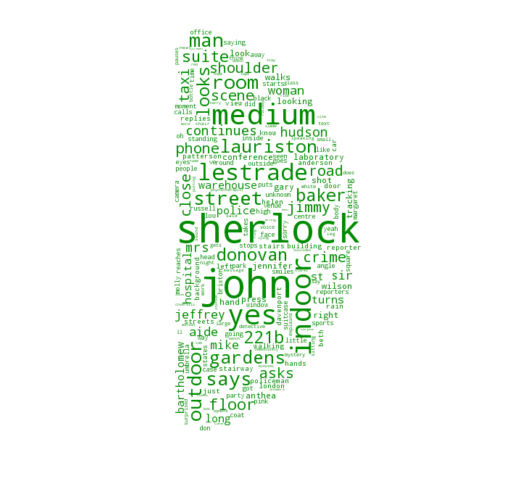

4
----------


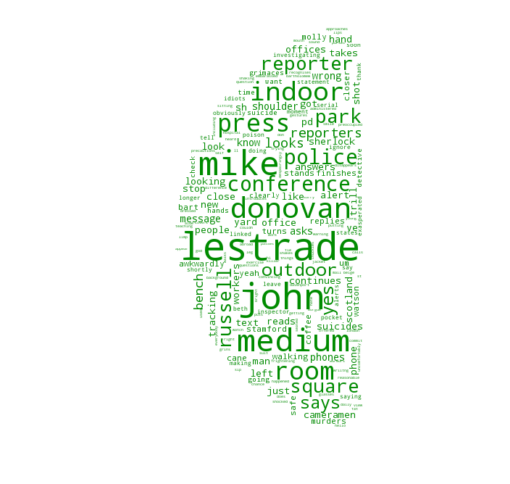

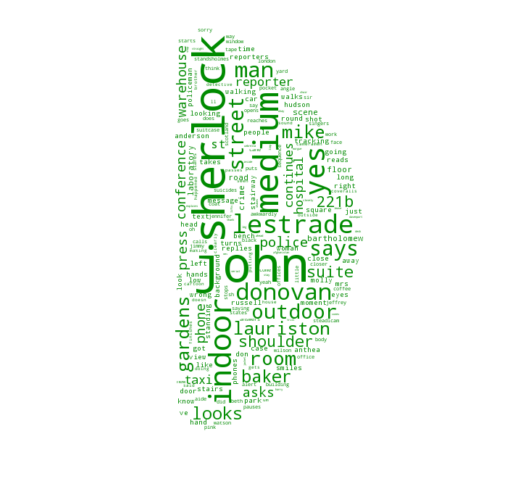

8
----------


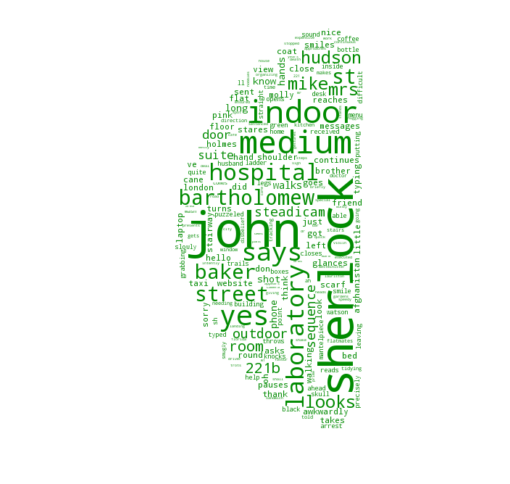

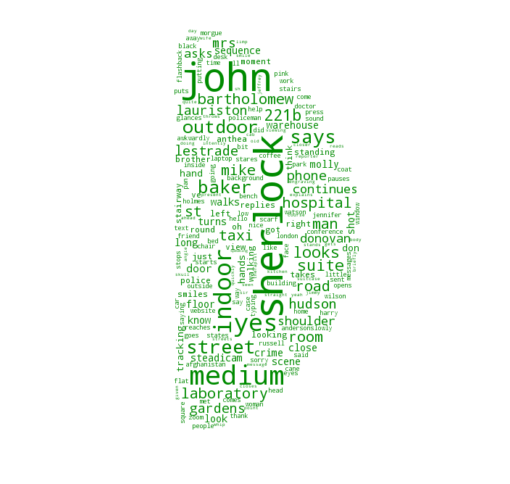

10
----------


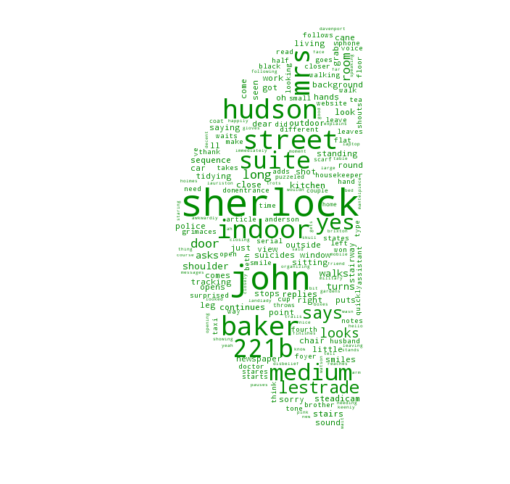

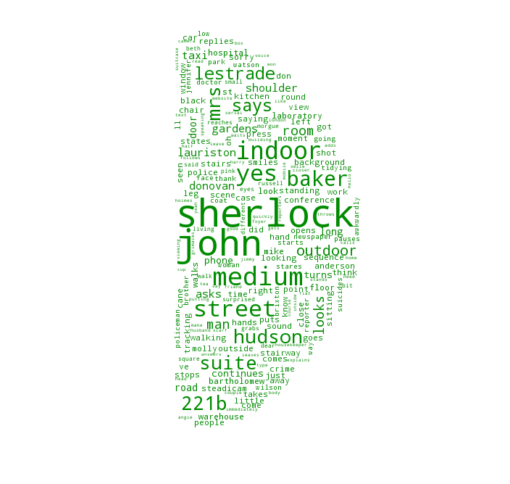

13
----------


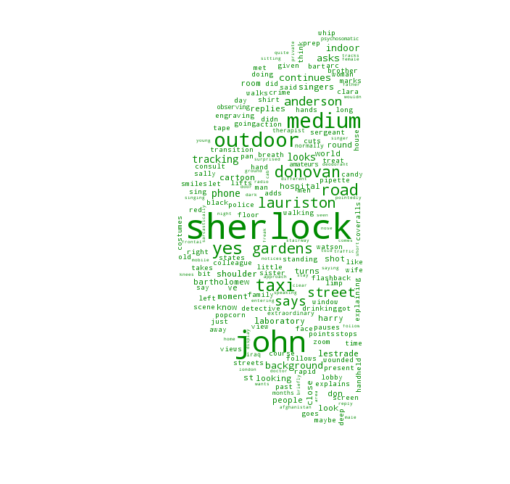

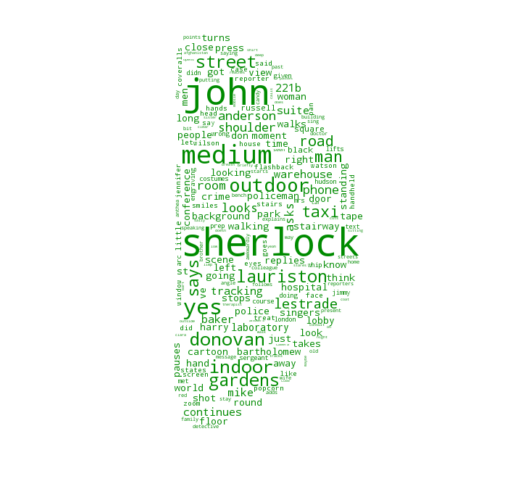

16
----------


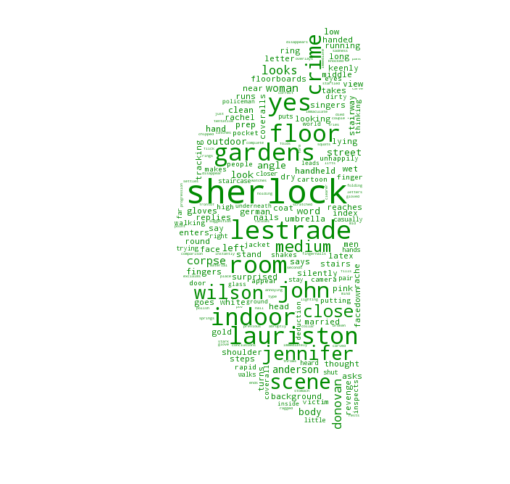

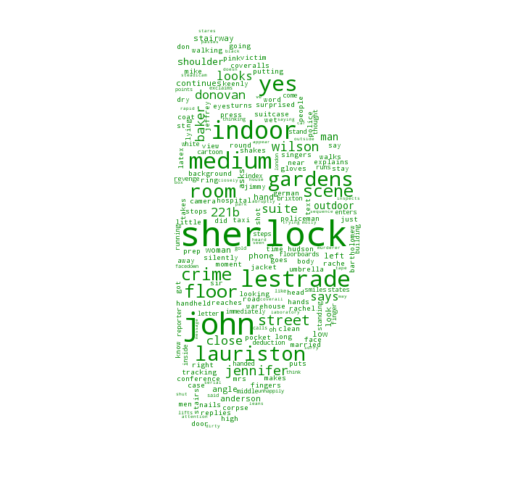

19
----------


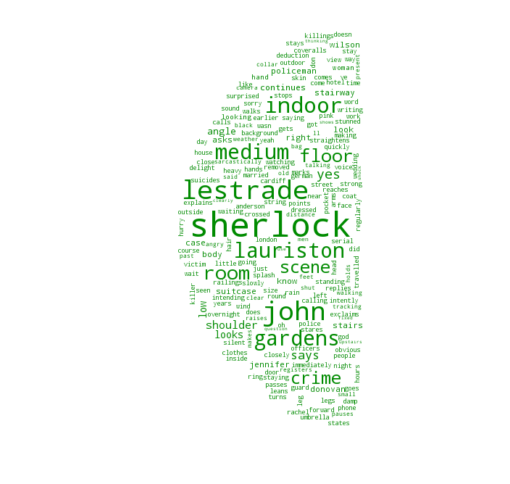

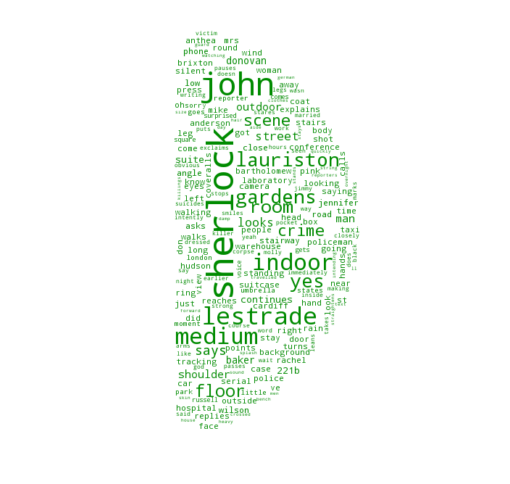

21
----------


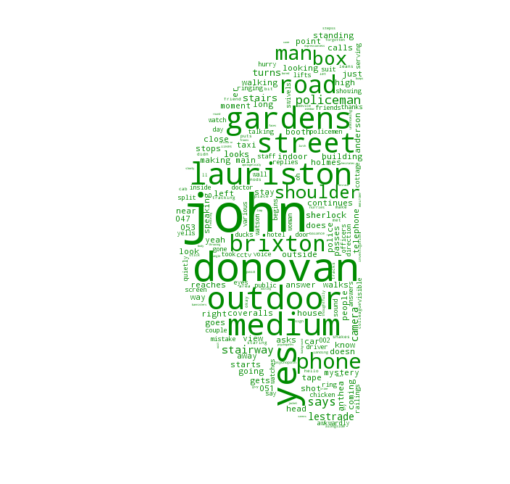

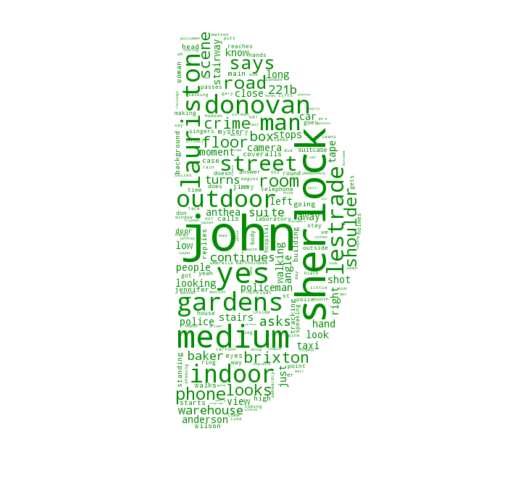

23
----------


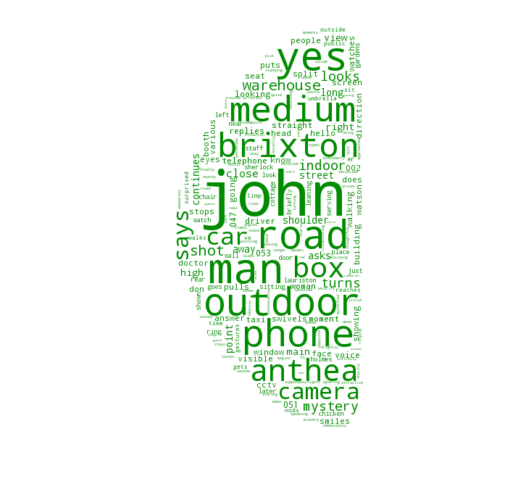

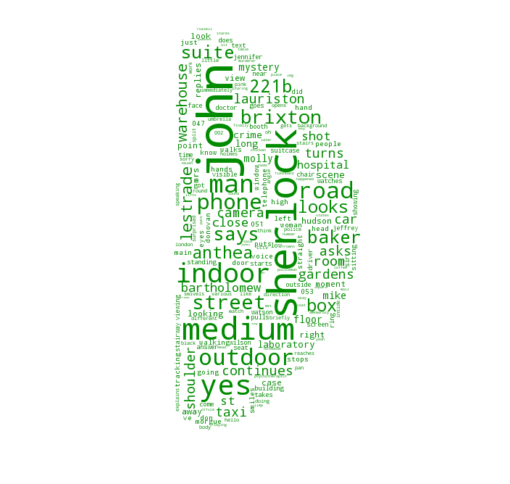

27
----------


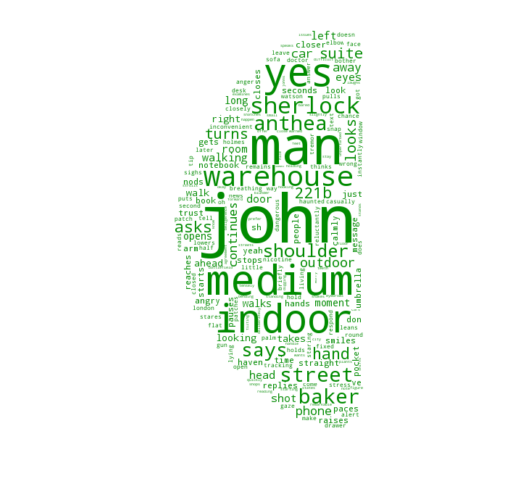

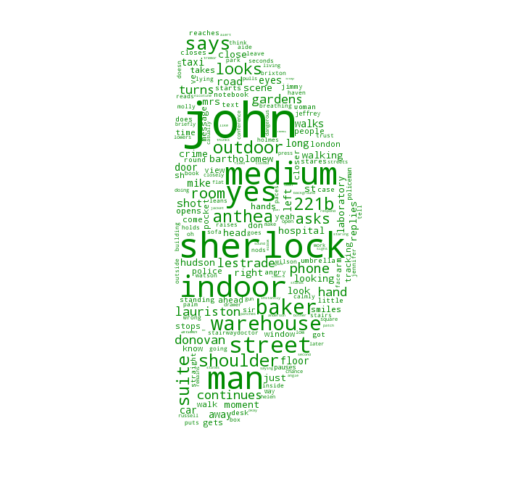

31
----------


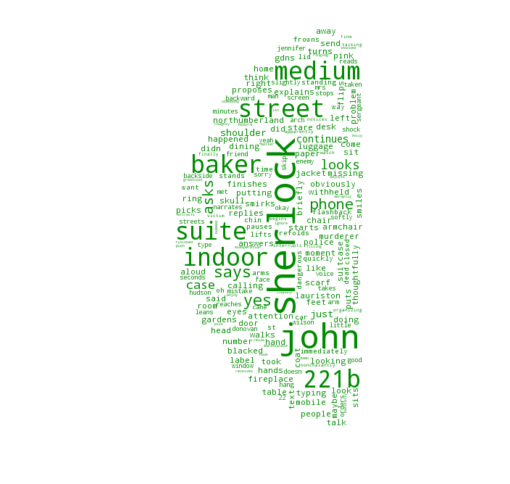

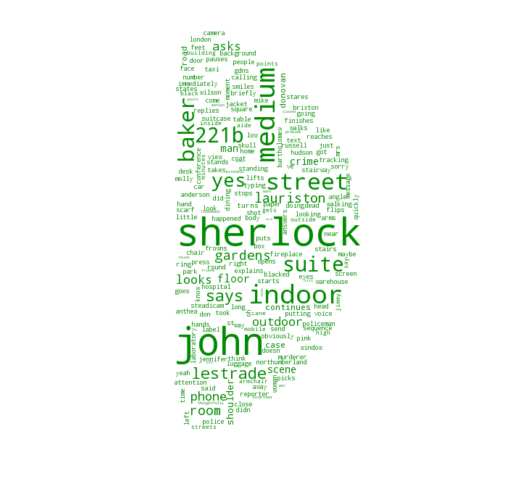

33
----------


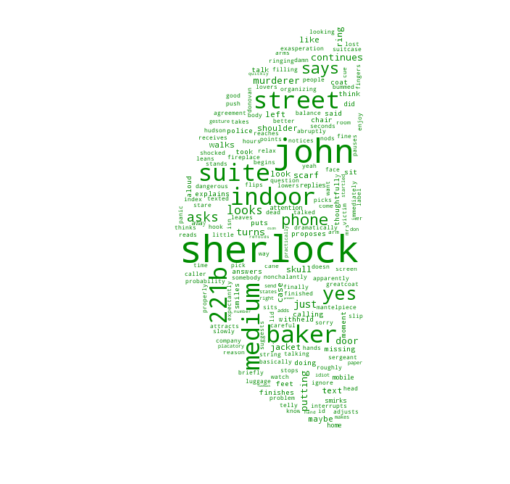

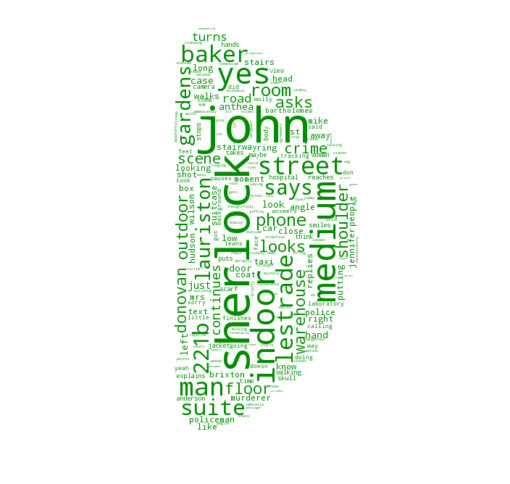

In [275]:
default_color = 'grey'
for seg in [0, 2, 4, 8, 10, 13, 16, 19, 21, 23, 27, 31, 33]:
    
    print(seg)
    print('----------')
    weights = np.dot(video_events[seg,:].reshape(1,100), tm.components_).ravel()
    textdict_video = {word:weight for word, weight in zip(cv.get_feature_names(), weights)}
    weights = np.dot(avg_recall_events[seg,:].reshape(1,100), tm.components_).ravel()
    textdict_recall = {word:weight for word, weight in zip(cv.get_feature_names(), weights)}

    color_to_words = {'#008b00': list(set(textdict_video).intersection(set(textdict_recall)))}
    grouped_color_func = SimpleGroupedColorFunc(color_to_words, default_color)

    plot_wordle(textdict_video, maskpath="../data/half-moon-left.jpg")
    plt.show()
    plot_wordle(textdict_recall, maskpath="../data/half-moon.jpg")
    plt.show()

In [290]:
norm_video_events = np.dot(video_events, tm.components_)
norm_video_events-=norm_video_events.mean(0)
norm_video_events-=np.min(norm_video_events)
norm_video_events/=np.max(norm_video_events)

norm_avg_recall_events = np.dot(avg_recall_events, tm.components_)
norm_avg_recall_events-=norm_avg_recall_events.mean(0)
norm_avg_recall_events-=np.min(norm_avg_recall_events)
norm_avg_recall_events/=np.max(norm_avg_recall_events)

In [296]:
import collections
def topn(d, n):
    c = collections.Counter(d)
    return {k:v for k, v in c.most_common(n)}

0
----------


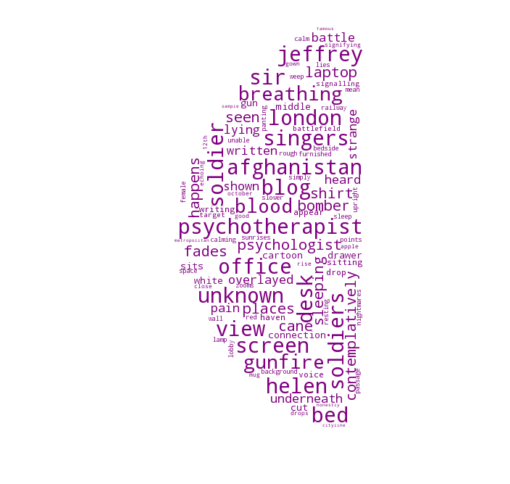

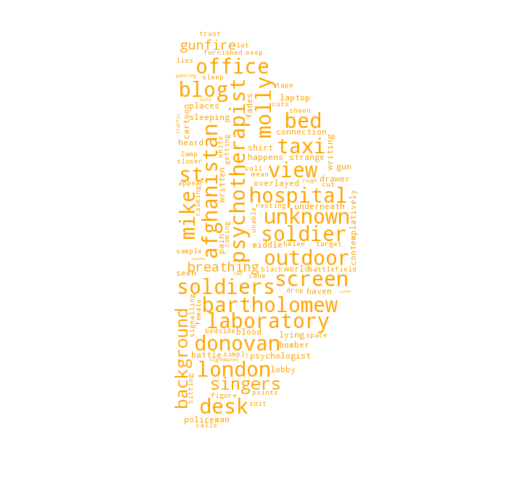

2
----------


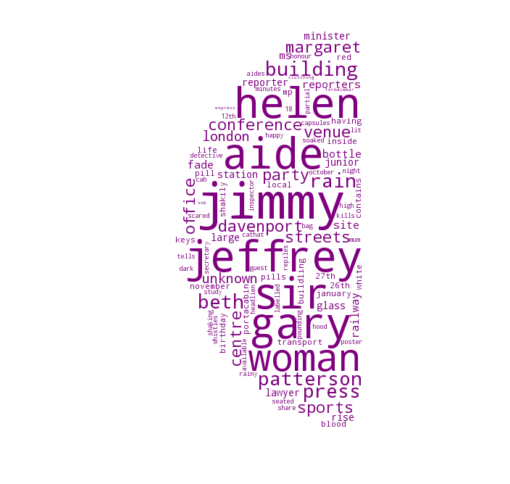

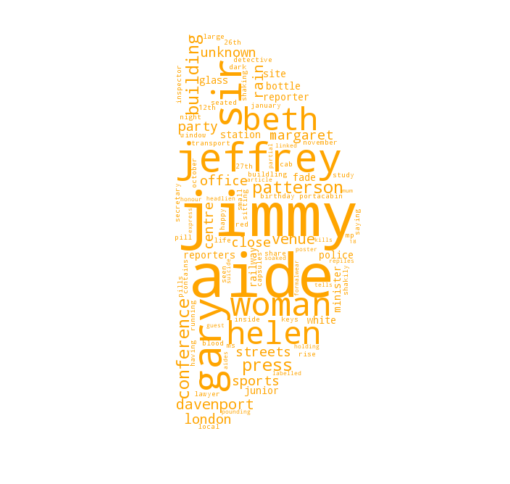

4
----------


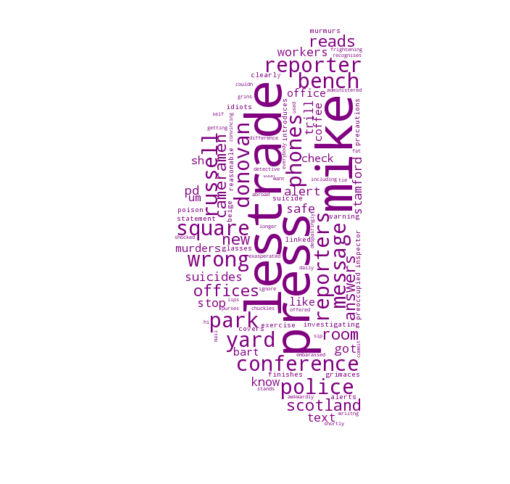

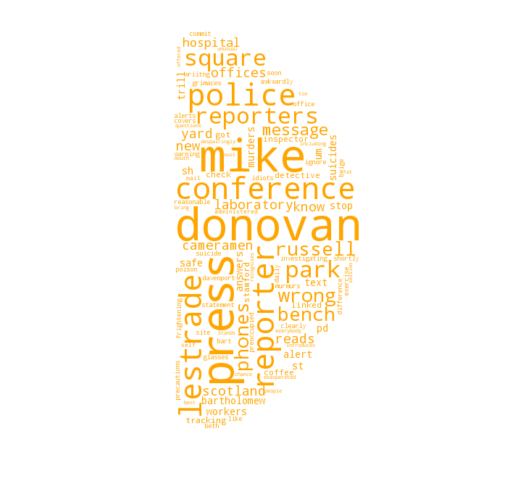

8
----------


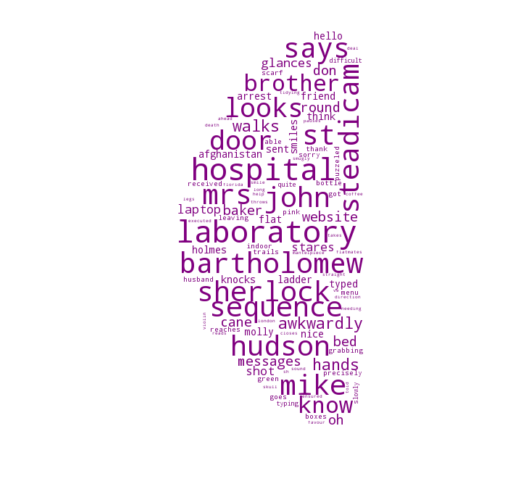

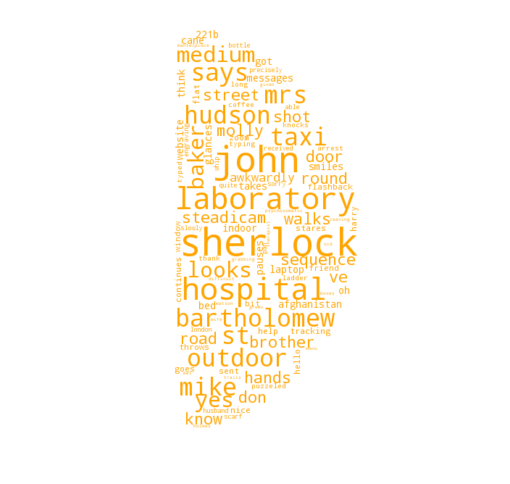

10
----------


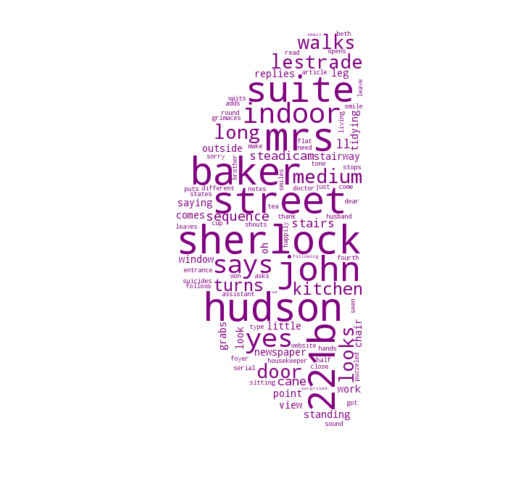

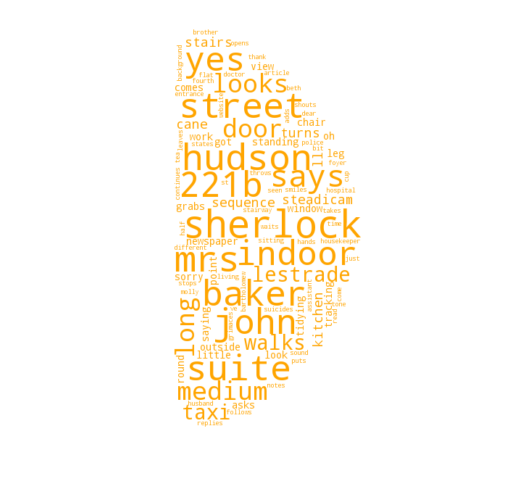

13
----------


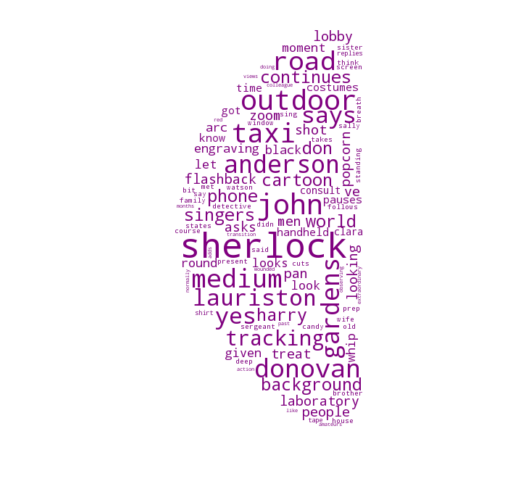

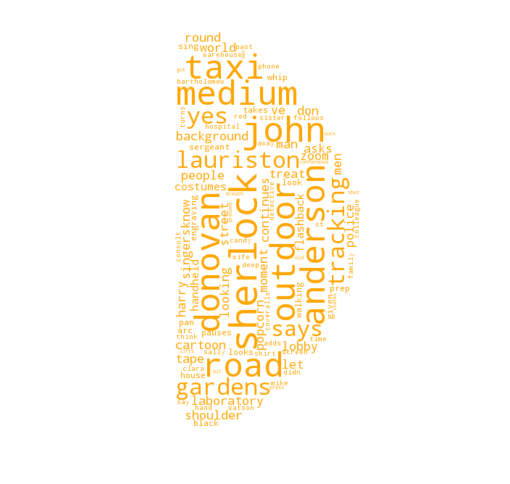

16
----------


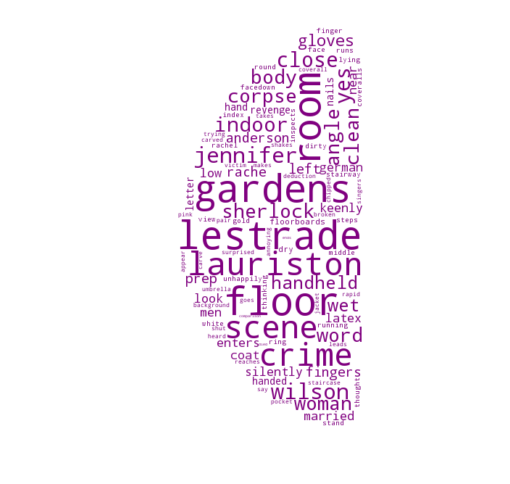

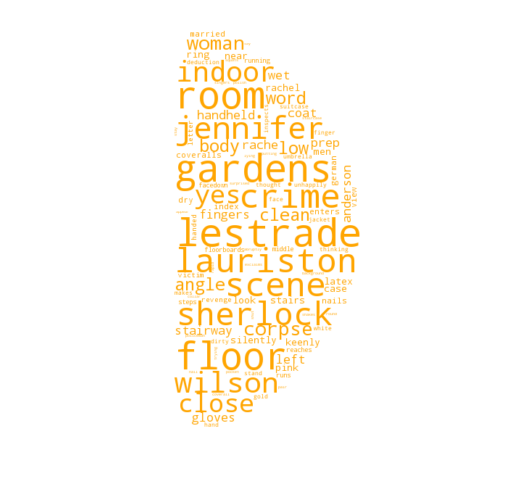

19
----------


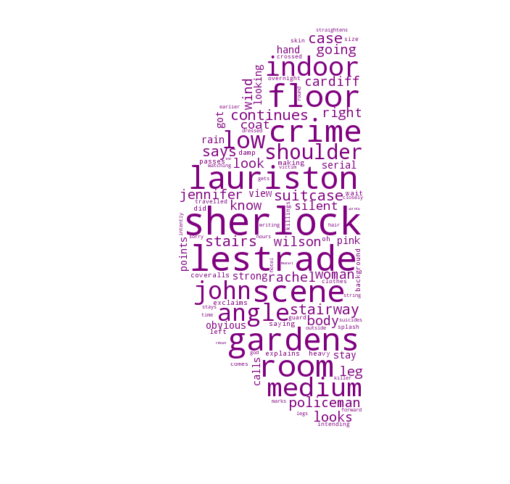

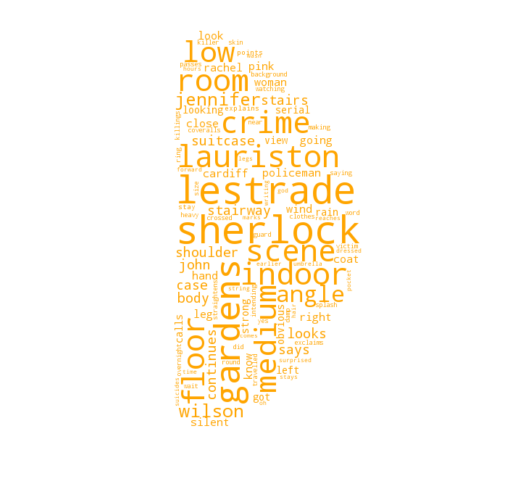

21
----------


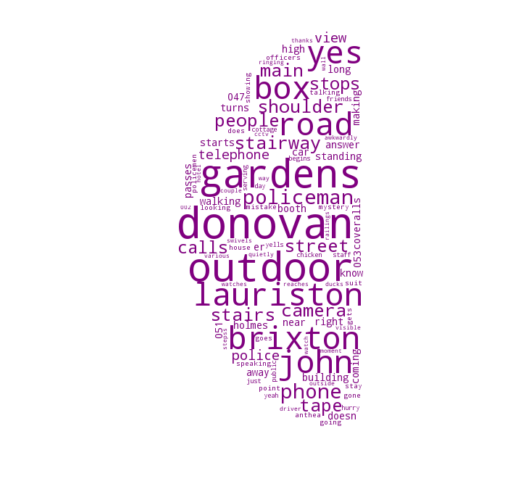

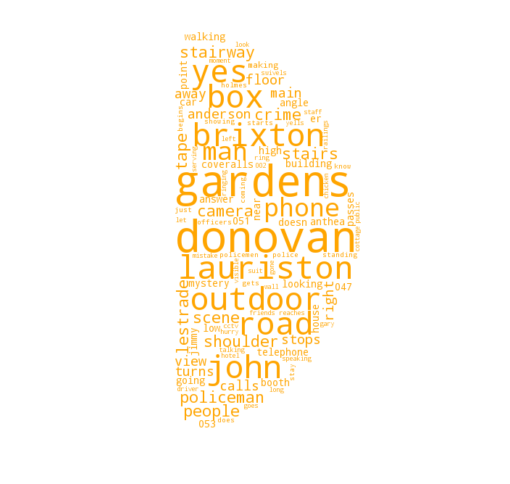

23
----------


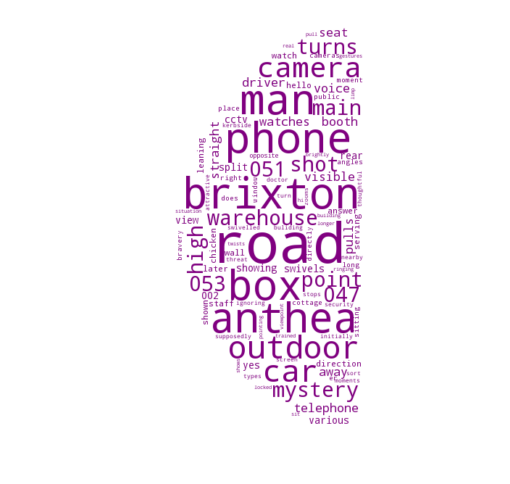

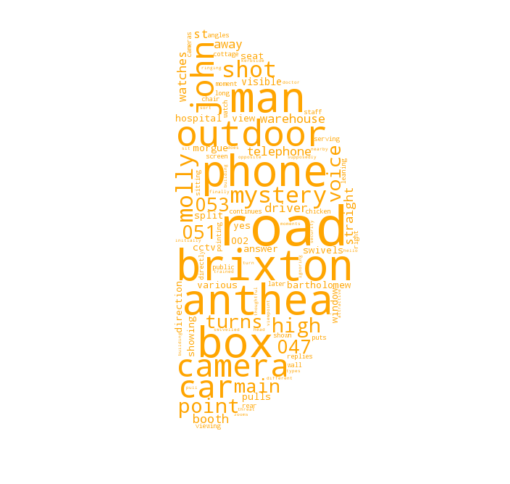

27
----------


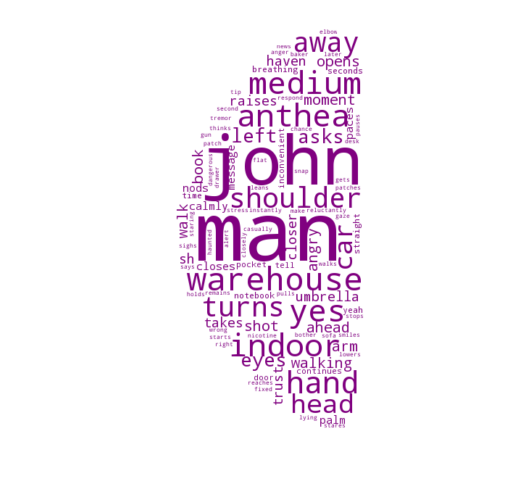

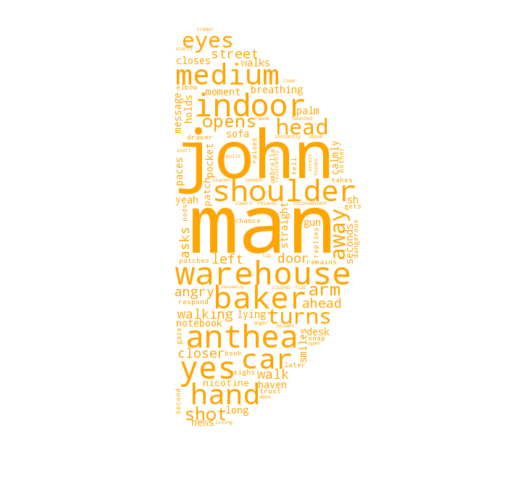

31
----------


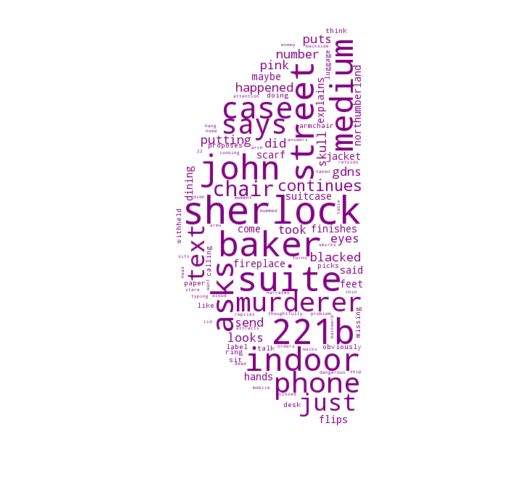

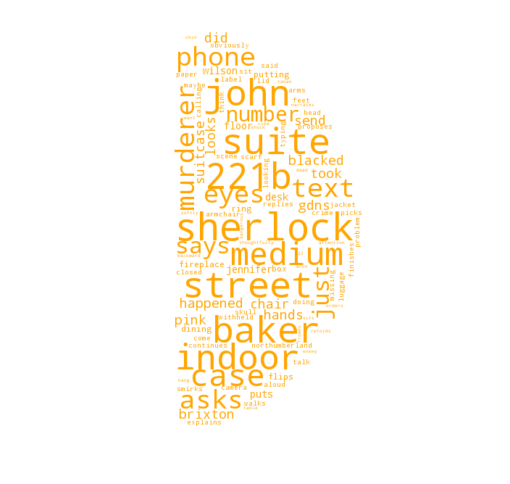

33
----------


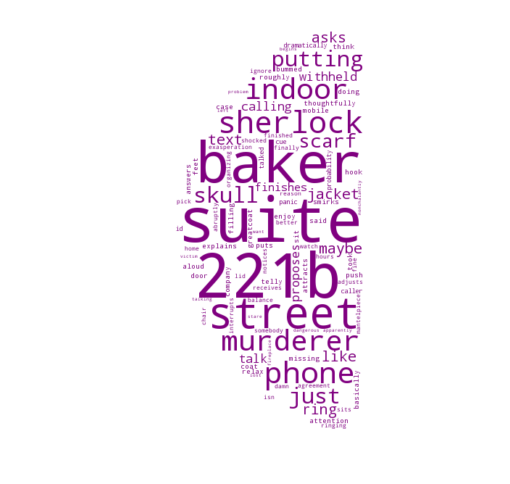

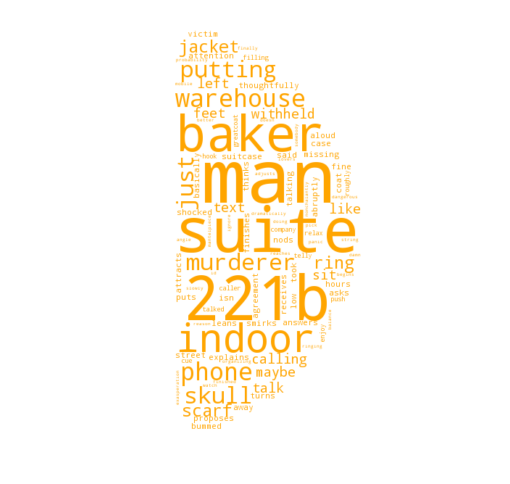

In [298]:
default_color = 'grey'
n=100
    
for seg in [0, 2, 4, 8, 10, 13, 16, 19, 21, 23, 27, 31, 33]:
    
    print(seg)
    print('----------')
    weights = norm_video_events[seg,:]
    textdict_video = topn({word:weight for word, weight in zip(cv.get_feature_names(), weights)}, n)
    weights = norm_avg_recall_events[seg,:]
    textdict_recall = topn({word:weight for word, weight in zip(cv.get_feature_names(), weights)}, n)

    color_to_words = {'purple': list(set(textdict_video))}
    grouped_color_func = SimpleGroupedColorFunc(color_to_words, default_color)
    plot_wordle(textdict_video, maskpath="../data/half-moon-left.jpg")
    plt.show()
    color_to_words = {'orange': list(set(textdict_recall))}
    grouped_color_func = SimpleGroupedColorFunc(color_to_words, default_color)
    plot_wordle(textdict_recall, maskpath="../data/half-moon.jpg")
    plt.show()